# Machine Learning Project

### **House prices Dataset**

#### **Import modules**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats
plt.style.use('ggplot')

#### **Read data**

In [2]:
df = pd.read_csv('train.csv', keep_default_na = False, low_memory = False)

In [3]:
df['PropertyType'] = pd.cut(df['SalePrice'].values, bins = (-0.1, 150000, 299999, 755000), labels = ('Low', 'Medium', 'High'), include_lowest=True)
df['PropertyType'] = df['PropertyType'].astype('category')
df.drop(columns=['SalePrice'], inplace=True)

### **Data Understanding**

##### **Data dimension (n_rows x n_columns)**

In [4]:
df.shape

(1460, 81)

##### **How many elements?**

In [5]:
df.size

118260

##### **Attributes**

In [6]:
print(df.columns.tolist())

['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC'

##### **Top 10 records**

In [7]:
df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,PropertyType
0,1,60,RL,65,8450,Pave,NA,Reg,Lvl,AllPub,...,0,NA,NA,NA,0,2,2008,WD,Normal,Medium
1,2,20,RL,80,9600,Pave,NA,Reg,Lvl,AllPub,...,0,NA,NA,NA,0,5,2007,WD,Normal,Medium
2,3,60,RL,68,11250,Pave,NA,IR1,Lvl,AllPub,...,0,NA,NA,NA,0,9,2008,WD,Normal,Medium
3,4,70,RL,60,9550,Pave,NA,IR1,Lvl,AllPub,...,0,NA,NA,NA,0,2,2006,WD,Abnorml,Low
4,5,60,RL,84,14260,Pave,NA,IR1,Lvl,AllPub,...,0,NA,NA,NA,0,12,2008,WD,Normal,Medium
5,6,50,RL,85,14115,Pave,NA,IR1,Lvl,AllPub,...,0,NA,MnPrv,Shed,700,10,2009,WD,Normal,Low
6,7,20,RL,75,10084,Pave,NA,Reg,Lvl,AllPub,...,0,NA,NA,NA,0,8,2007,WD,Normal,High
7,8,60,RL,NA,10382,Pave,NA,IR1,Lvl,AllPub,...,0,NA,NA,Shed,350,11,2009,WD,Normal,Medium
8,9,50,RM,51,6120,Pave,NA,Reg,Lvl,AllPub,...,0,NA,NA,NA,0,4,2008,WD,Abnorml,Low
9,10,190,RL,50,7420,Pave,NA,Reg,Lvl,AllPub,...,0,NA,NA,NA,0,1,2008,WD,Normal,Low


##### **Get attribute type**

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             1460 non-null   int64   
 1   MSSubClass     1460 non-null   int64   
 2   MSZoning       1460 non-null   object  
 3   LotFrontage    1460 non-null   object  
 4   LotArea        1460 non-null   int64   
 5   Street         1460 non-null   object  
 6   Alley          1460 non-null   object  
 7   LotShape       1460 non-null   object  
 8   LandContour    1460 non-null   object  
 9   Utilities      1460 non-null   object  
 10  LotConfig      1460 non-null   object  
 11  LandSlope      1460 non-null   object  
 12  Neighborhood   1460 non-null   object  
 13  Condition1     1460 non-null   object  
 14  Condition2     1460 non-null   object  
 15  BldgType       1460 non-null   object  
 16  HouseStyle     1460 non-null   object  
 17  OverallQual    1460 non-null   in

#### **Convert wrong attribute types  and fill wrong NA values**

In [9]:
for attribute in df.columns:
    if df[attribute].dtype == object:
        df[attribute] = df[attribute].astype('category')

df['Id'] = df['Id'].astype('category')
df['MSSubClass'] = df['MSSubClass'].astype('category')
df['YearBuilt'] = df['YearBuilt'].astype('category')
df['YearRemodAdd'] = df['YearRemodAdd'].astype('category')
df['MoSold'] = df['MoSold'].astype('category')
df['YrSold'] = df['YrSold'].astype('category')
df['OverallQual'] = df['OverallQual'].astype('category')
df['OverallCond'] = df['OverallCond'].astype('category')

# Replace all "NA" values with median/mode and convert attribute type
df['LotFrontage'] = pd.to_numeric(df['LotFrontage'], errors='coerce')
df['LotFrontage'] = df['LotFrontage'].fillna(df['LotFrontage'].median())
df['LotFrontage'] = df['LotFrontage'].astype('int64')

df['MasVnrArea'] = pd.to_numeric(df['MasVnrArea'], errors='coerce')
df['MasVnrArea'] = df['MasVnrArea'].fillna(df['MasVnrArea'].median())
df['MasVnrArea'] = df['MasVnrArea'].astype('int64')

df['Electrical'] = df['Electrical'].replace('NA', 'SBrkr')

df['MasVnrType'] = df['MasVnrType'].replace('NA', 'None')

df['GarageYrBlt'] = df['GarageYrBlt'].replace('NA', '2005')

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             1460 non-null   category
 1   MSSubClass     1460 non-null   category
 2   MSZoning       1460 non-null   category
 3   LotFrontage    1460 non-null   int64   
 4   LotArea        1460 non-null   int64   
 5   Street         1460 non-null   category
 6   Alley          1460 non-null   category
 7   LotShape       1460 non-null   category
 8   LandContour    1460 non-null   category
 9   Utilities      1460 non-null   category
 10  LotConfig      1460 non-null   category
 11  LandSlope      1460 non-null   category
 12  Neighborhood   1460 non-null   category
 13  Condition1     1460 non-null   category
 14  Condition2     1460 non-null   category
 15  BldgType       1460 non-null   category
 16  HouseStyle     1460 non-null   category
 17  OverallQual    1460 non-null   ca

#### **Are there any null values?**

In [11]:
df.isna().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
PropertyType     0
Length: 81, dtype: int64

##### **Get general statistics**

In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
LotFrontage,1460.0,69.863699,22.027677,21.0,60.00,69.0,79.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
MasVnrArea,1460.0,103.117123,180.731373,0.0,0.00,0.0,164.25,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.0,0.00,1474.0
BsmtUnfSF,1460.0,567.240411,441.866955,0.0,223.00,477.5,808.00,2336.0
TotalBsmtSF,1460.0,1057.429452,438.705324,0.0,795.75,991.5,1298.25,6110.0
1stFlrSF,1460.0,1162.626712,386.587738,334.0,882.00,1087.0,1391.25,4692.0
2ndFlrSF,1460.0,346.992466,436.528436,0.0,0.00,0.0,728.00,2065.0
LowQualFinSF,1460.0,5.844521,48.623081,0.0,0.00,0.0,0.00,572.0


In [13]:
df.describe(include = 'category').T

,count,unique,top,freq
Id,1460,1460,1,1
MSSubClass,1460,15,20,536
MSZoning,1460,5,RL,1151
Street,1460,2,Pave,1454
Alley,1460,3,NA,1369
LotShape,1460,4,Reg,925
LandContour,1460,4,Lvl,1311
Utilities,1460,2,AllPub,1459
LotConfig,1460,5,Inside,1052
LandSlope,1460,3,Gtl,1382


##### **Building histograms**

In [14]:
numericAttributes = []
categoricalAttributes = []
for attribute in df.columns:
    if df[attribute].dtype == 'category':
        categoricalAttributes.append(attribute)
    else: 
        numericAttributes.append(attribute)

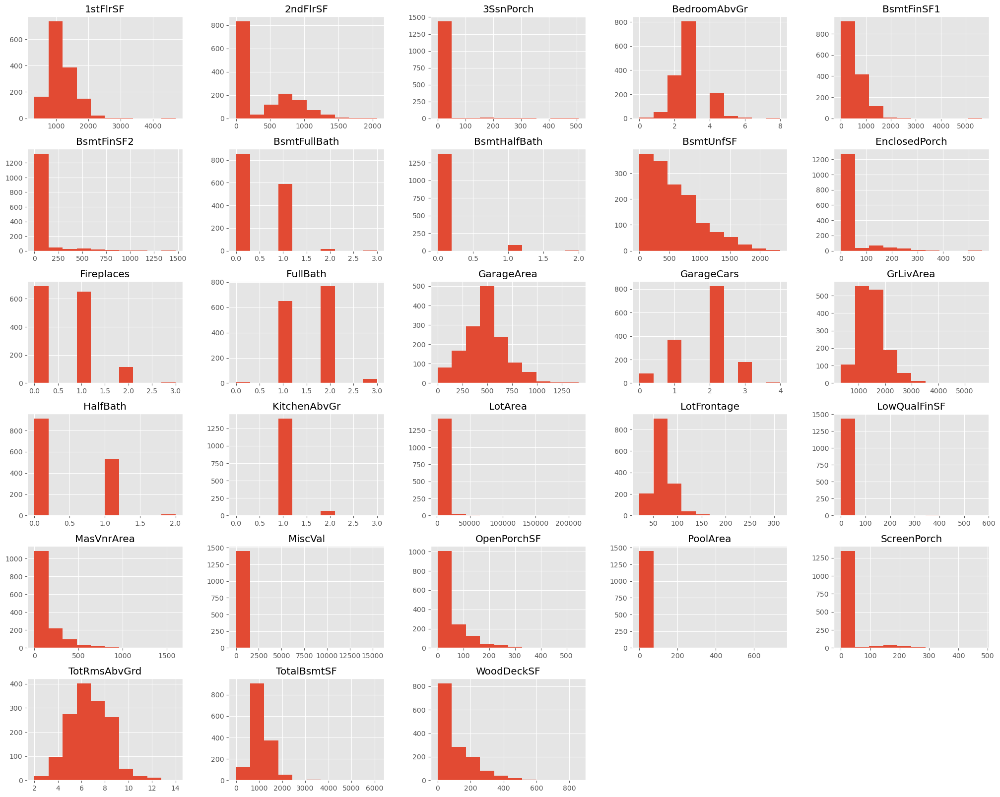

In [15]:
numericDF = df[df.columns.difference(categoricalAttributes)] 
numericDF.hist(figsize = (25, 20))
plt.show()

##### **Bar plots for categorical attributes**

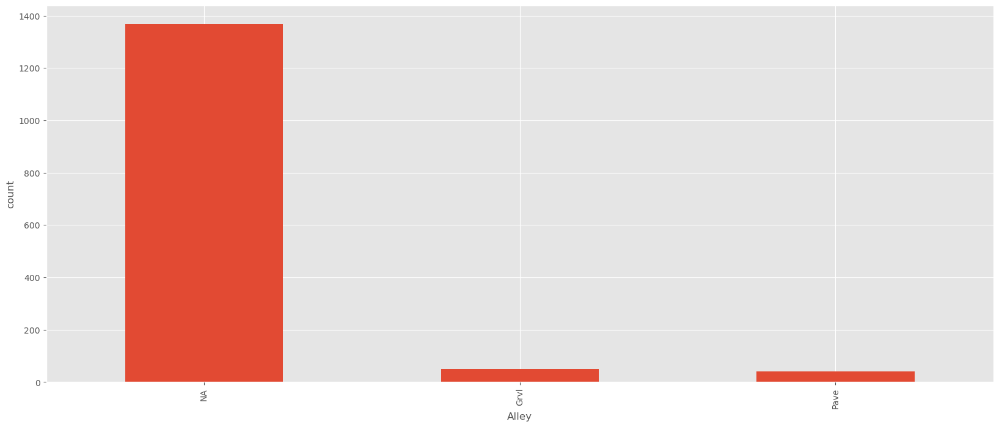

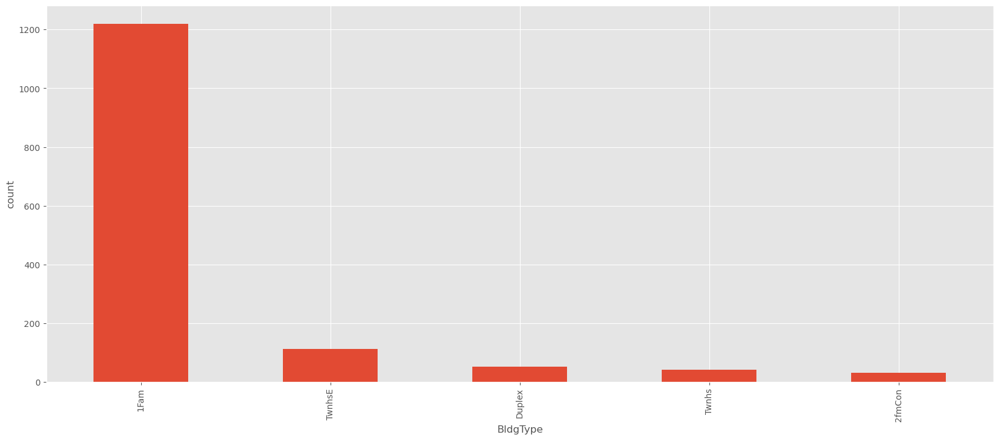

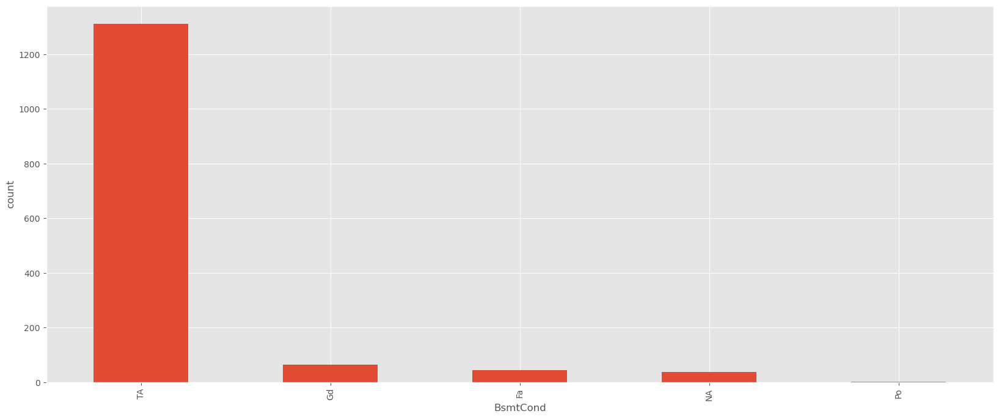

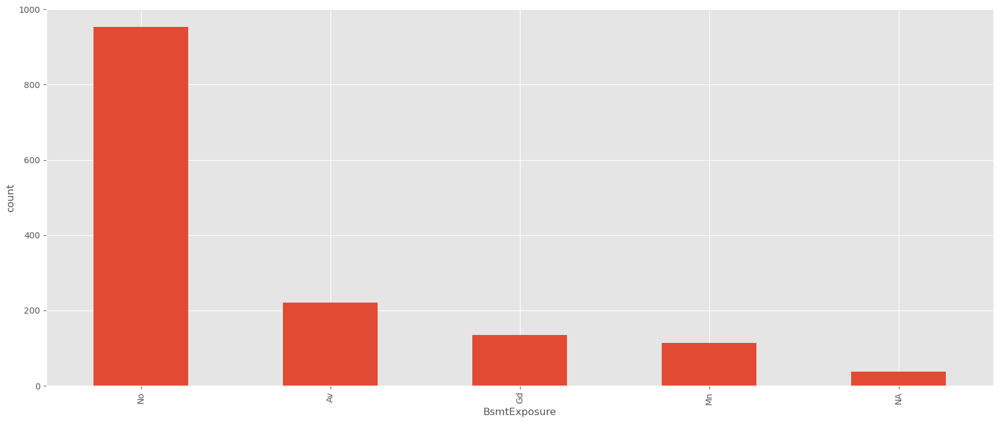

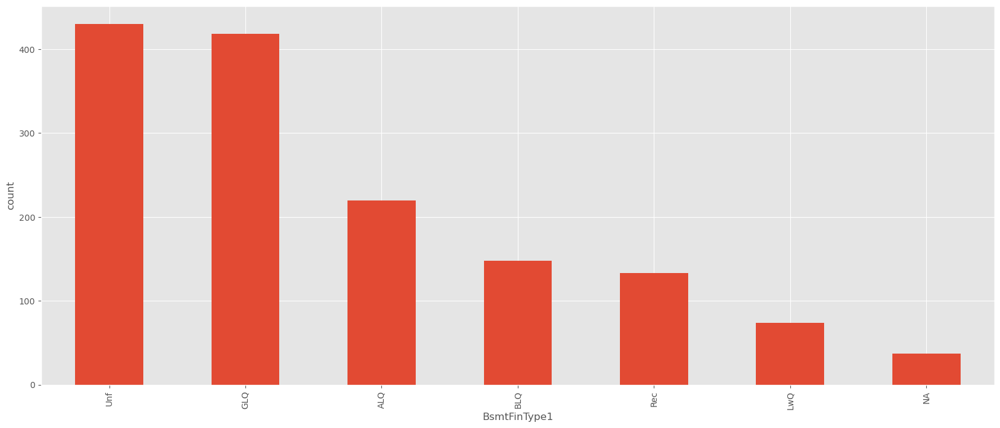

...

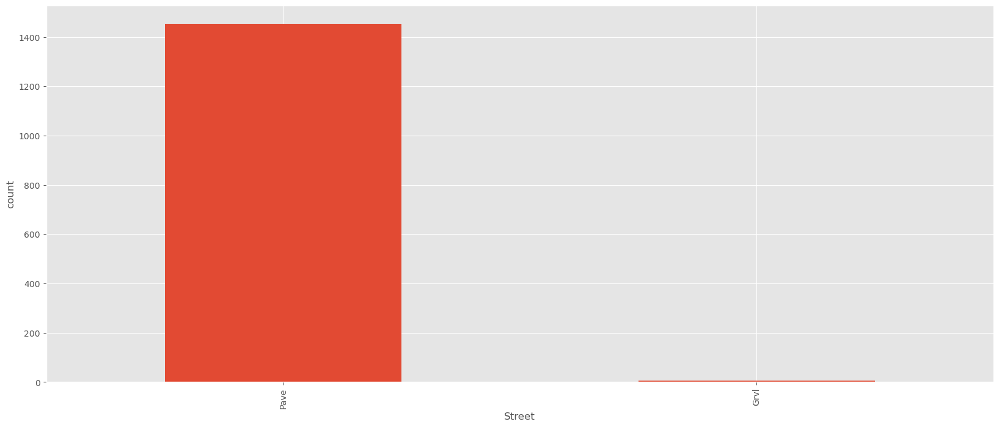

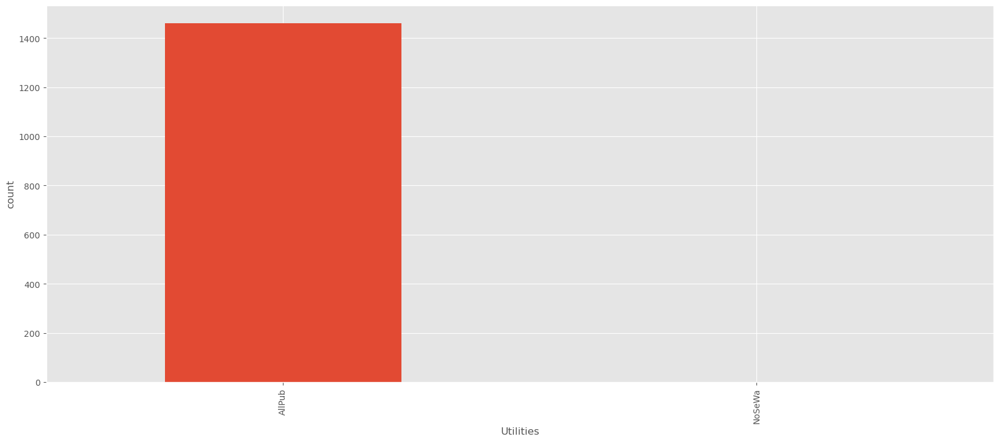

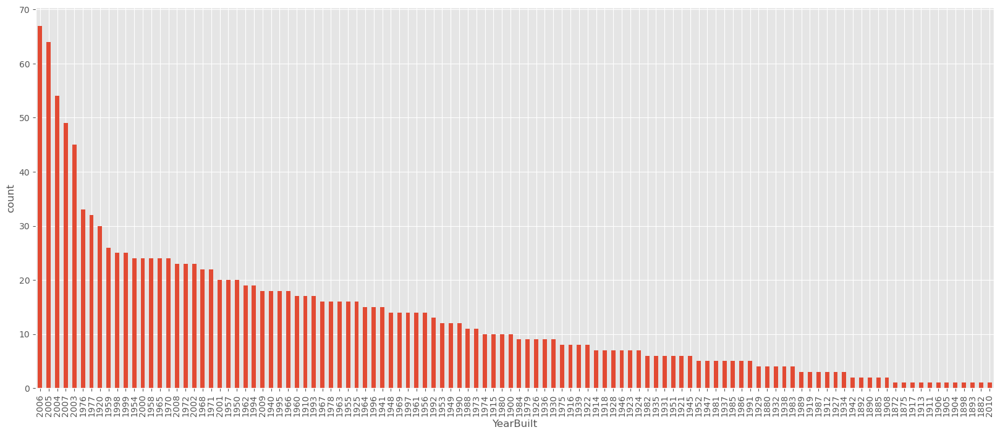

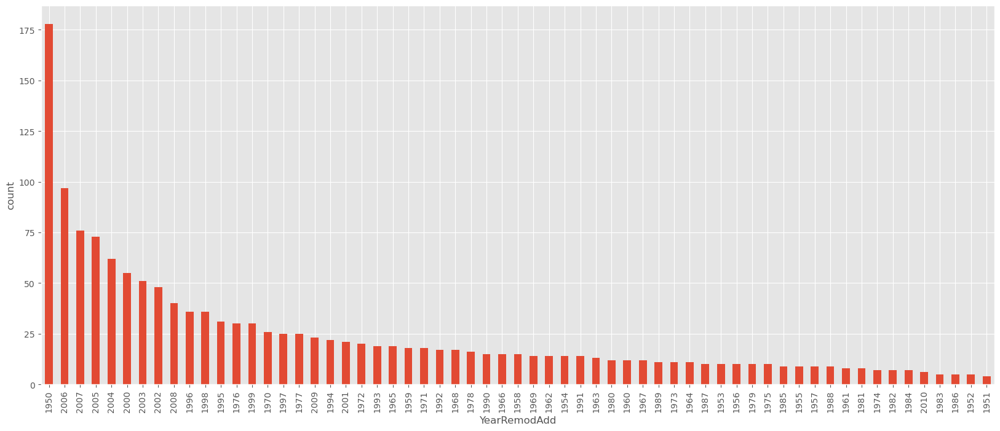

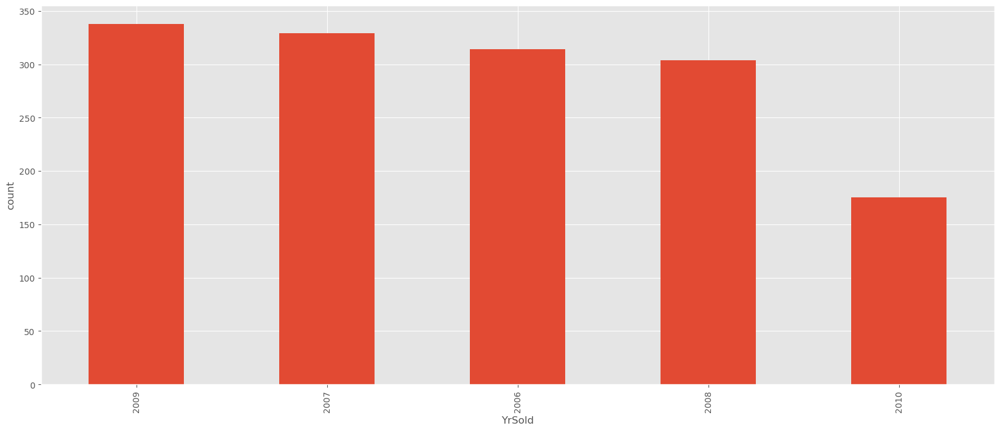

In [16]:
categoricalAttributes.remove('Id')
categoricalAttributes.sort()
for attribute in categoricalAttributes:
    val = df[attribute].value_counts()
    val.plot(kind = 'bar', figsize = (20, 8))
    plt.ylabel('count')
    plt.xlabel(attribute)
    plt.show()

#### **Histograms and bar plots according to the class attributes**

In [17]:
import seaborn as sb

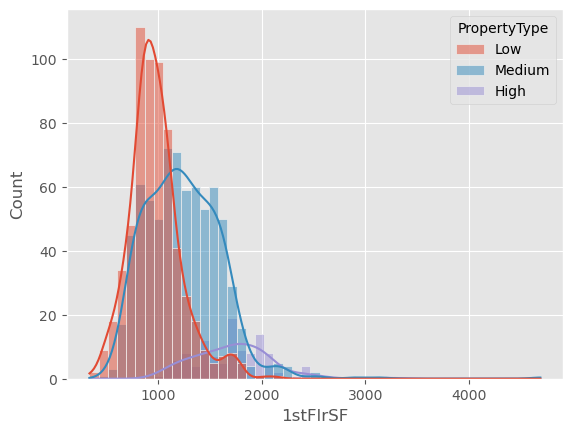

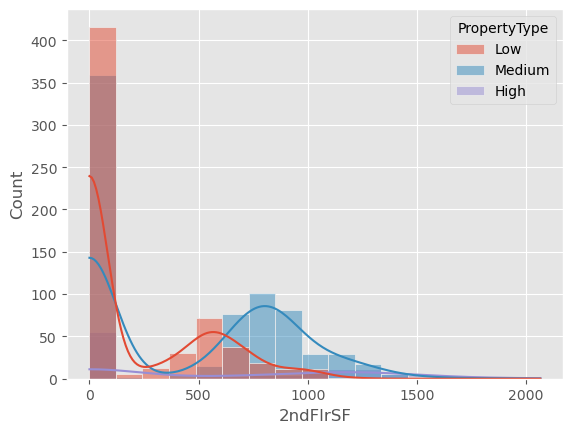

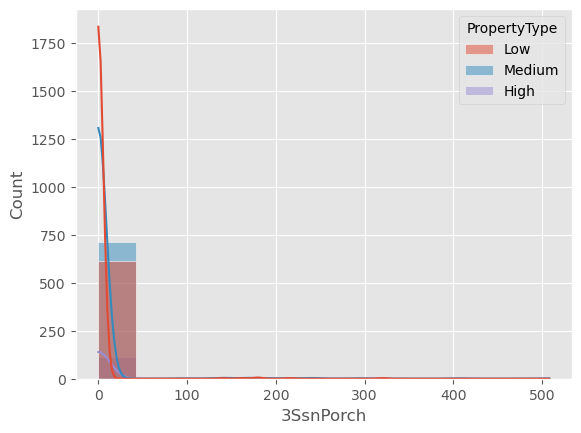

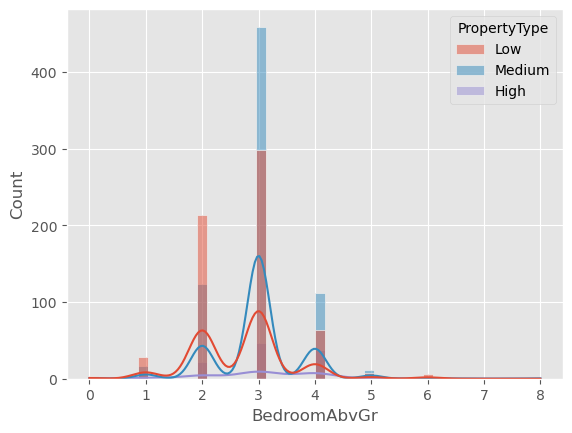

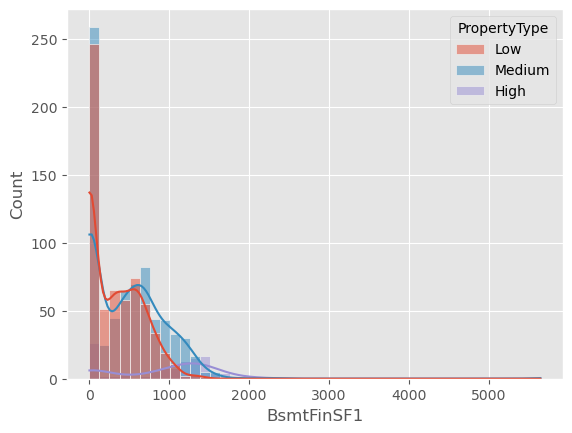

...

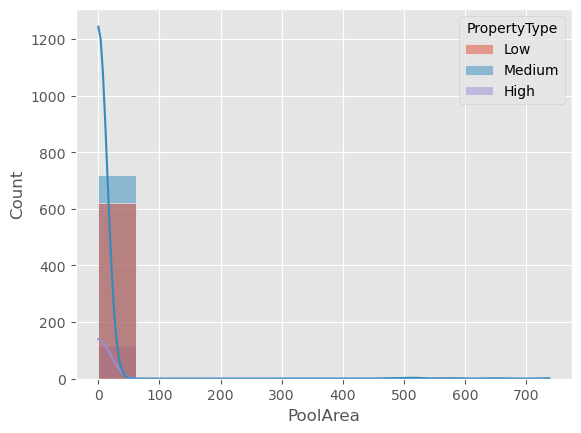

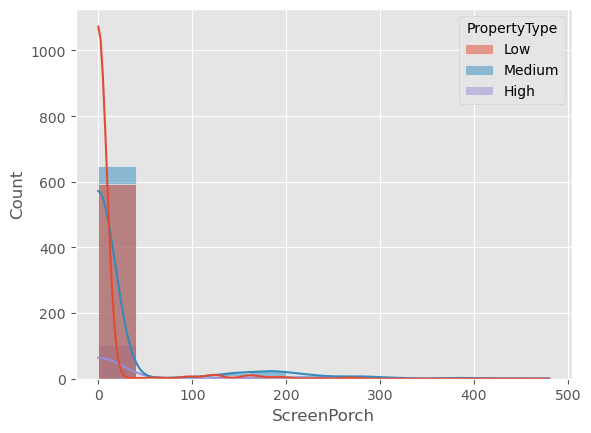

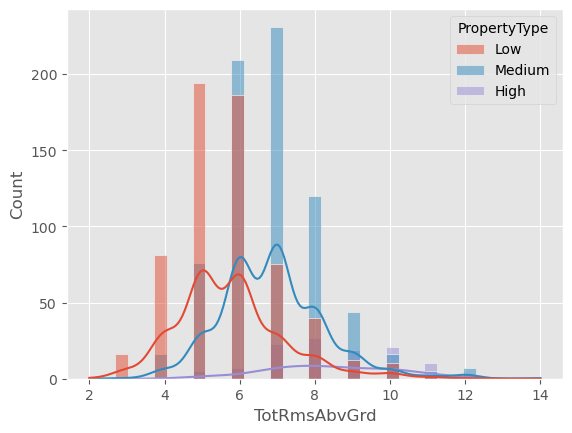

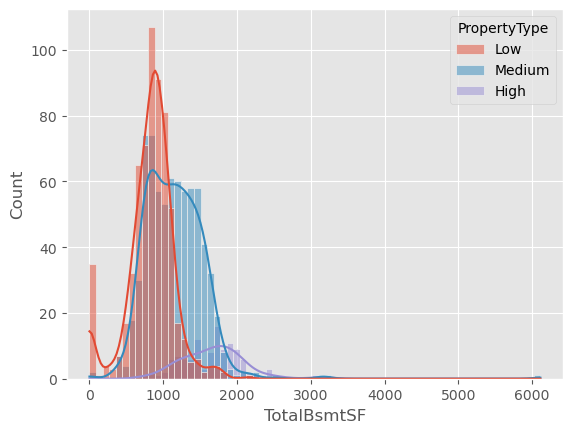

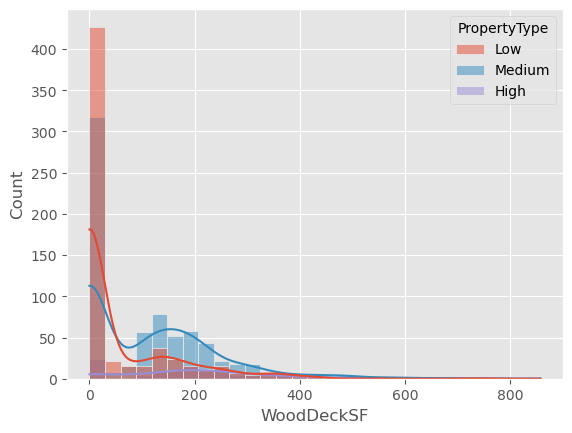

In [18]:
categoricalAttributes.remove('PropertyType')
categoricalAttributes.append('Id')
numericDF = df[df.columns.difference(categoricalAttributes)]
numericAttributes.sort()
for attribute in numericAttributes:
    sb.histplot(x = df[attribute], hue = 'PropertyType', data = numericDF, kde=True)
    plt.show()

In [19]:
categoricalDF = df[df.columns.difference(numericAttributes)]
categoricalAttributes.remove('Id')
categoricalAttributes.sort()

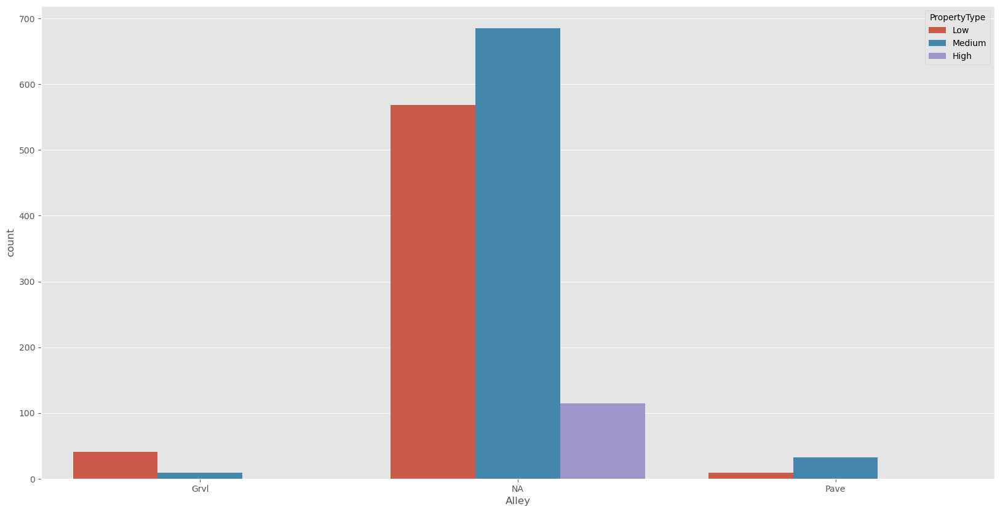

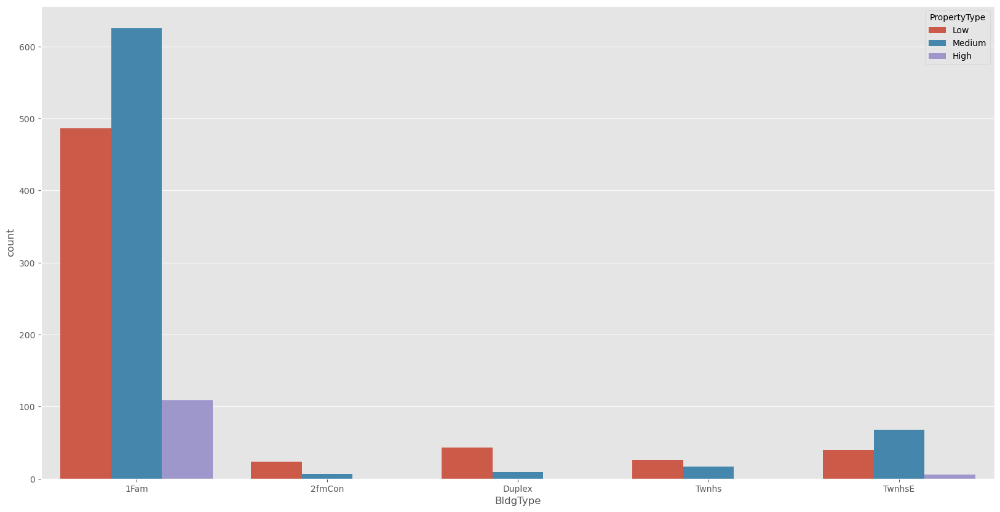

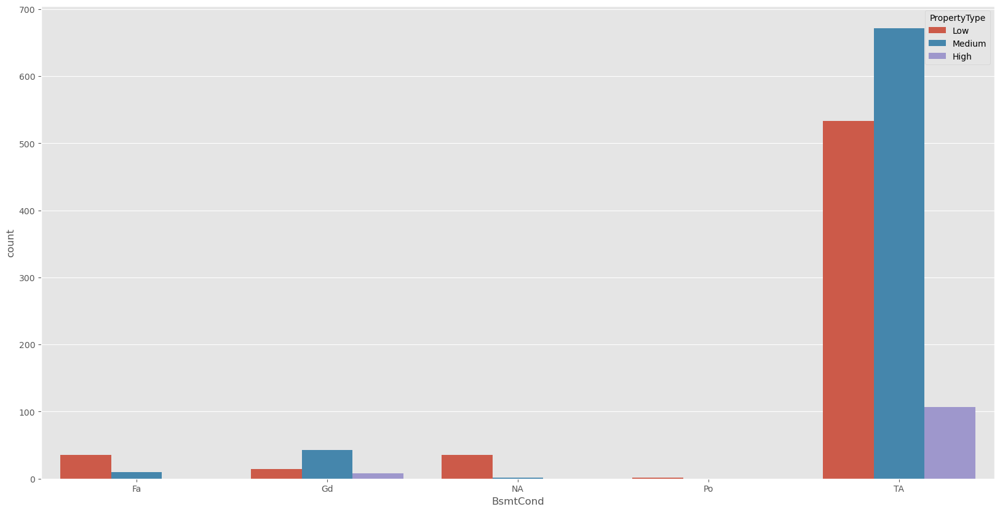

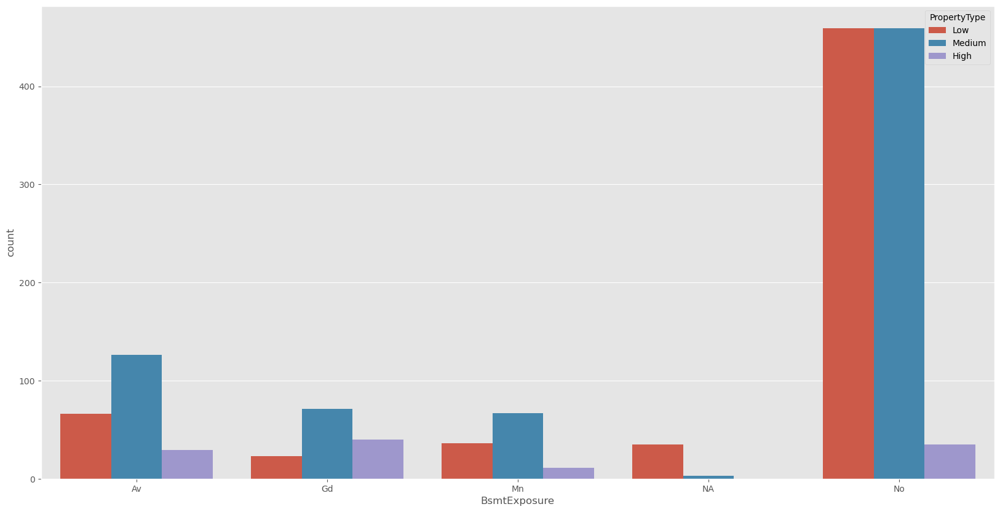

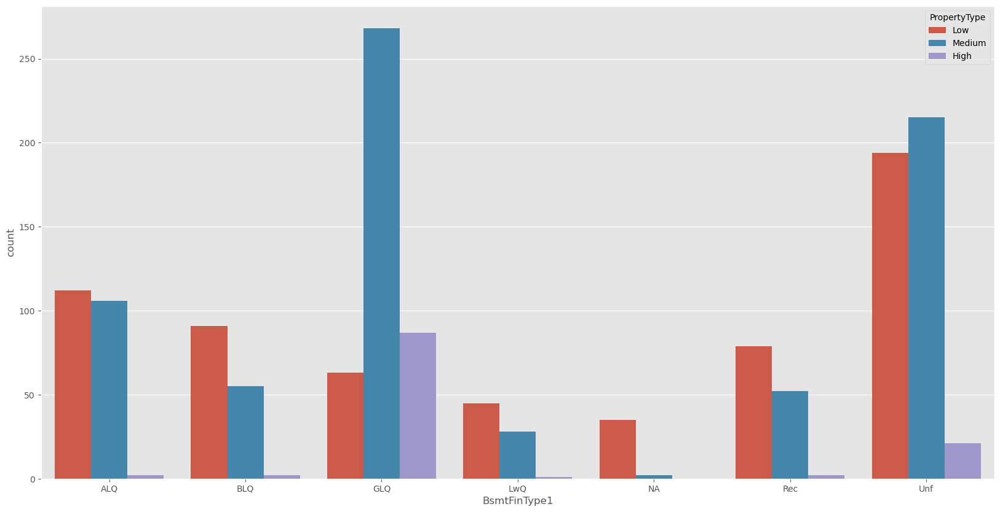

...

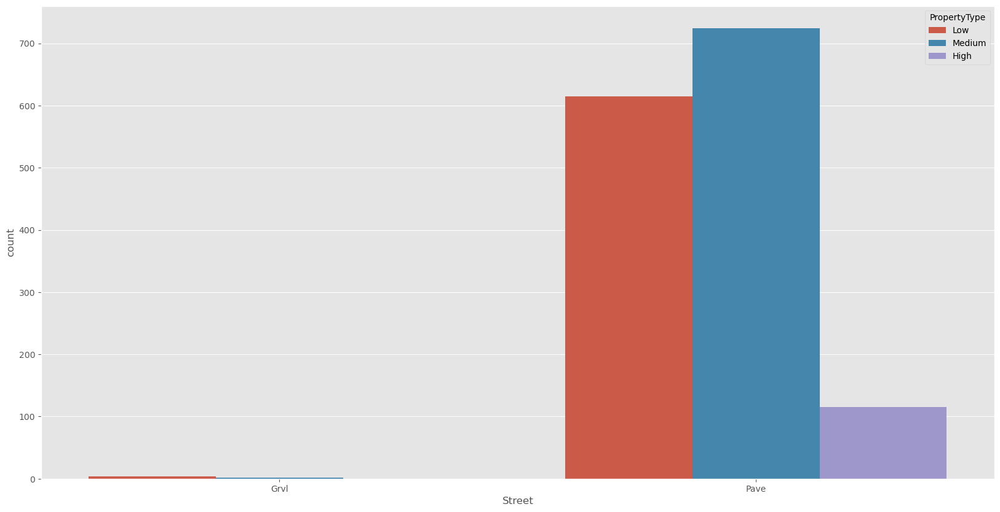

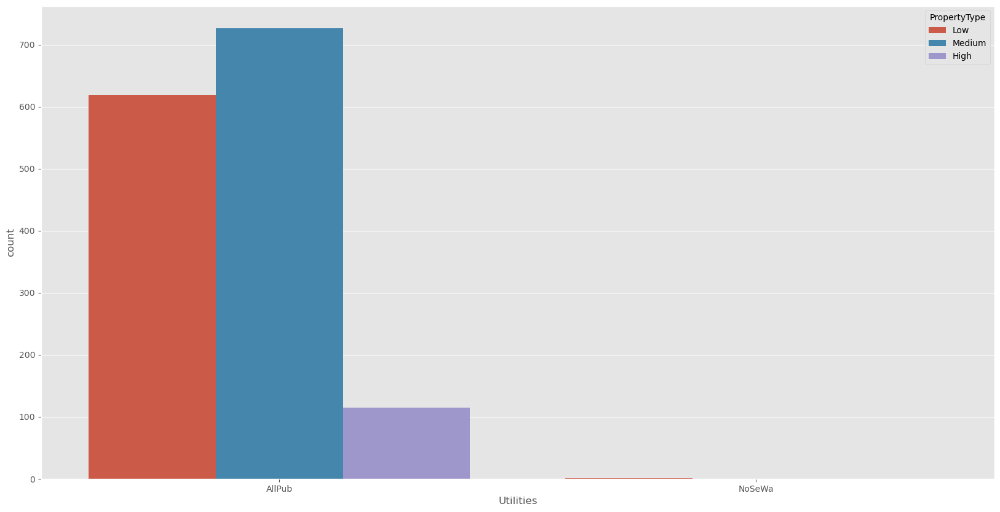

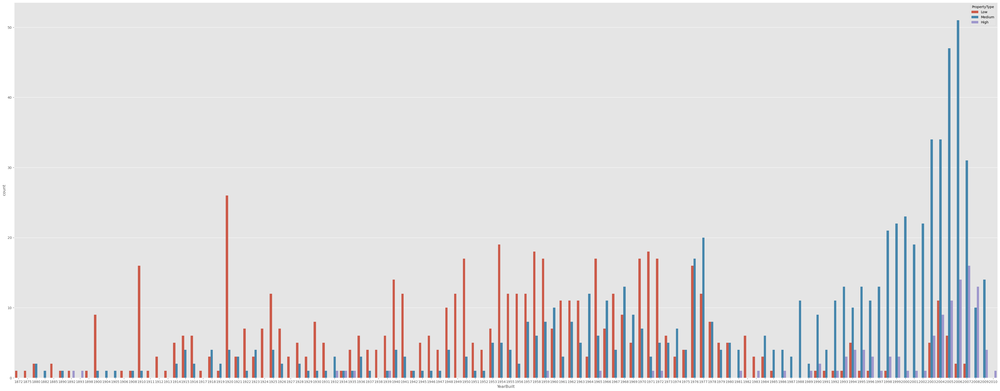

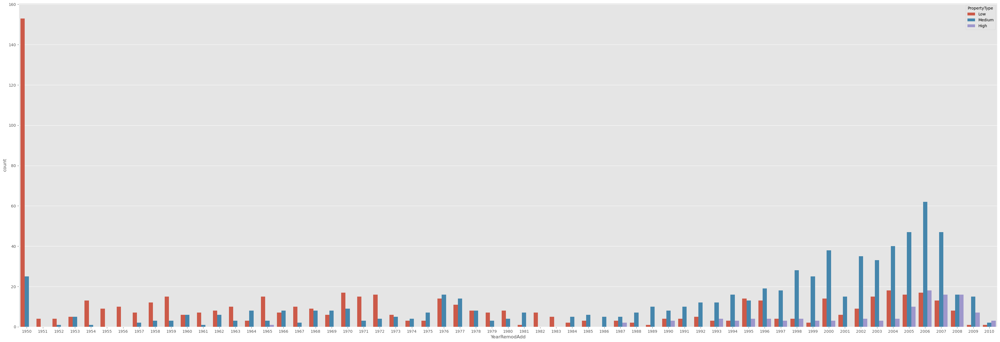

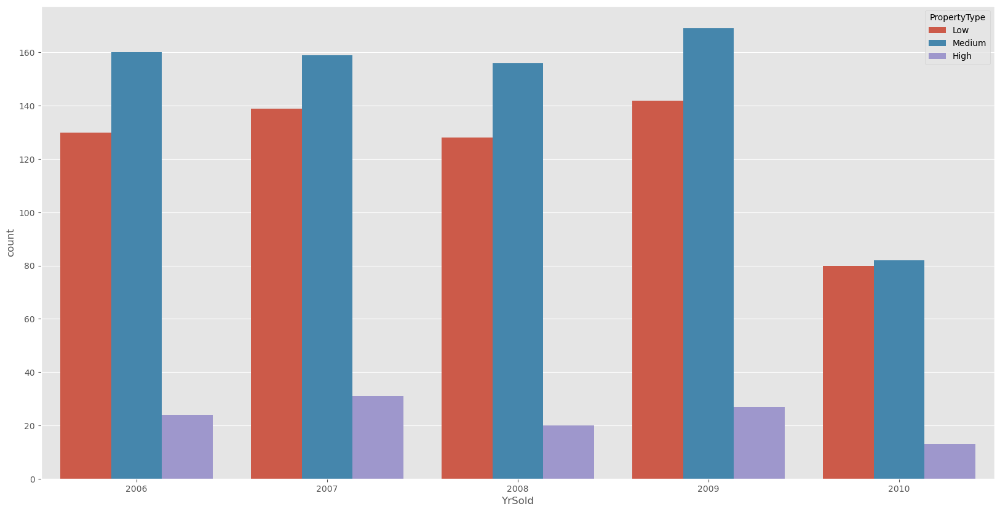

In [20]:
for attribute in categoricalAttributes:
    if attribute == 'YearRemodAdd' or attribute == 'GarageYrBlt':
        plt.figure(figsize = (45, 15))
    elif attribute == 'YearBuilt':
        plt.figure(figsize = (52, 20))
    else:
        plt.figure(figsize = (20, 10))
    sb.countplot(x = df[attribute], hue = 'PropertyType', data = categoricalDF)
    plt.show()

##### **Box plot**

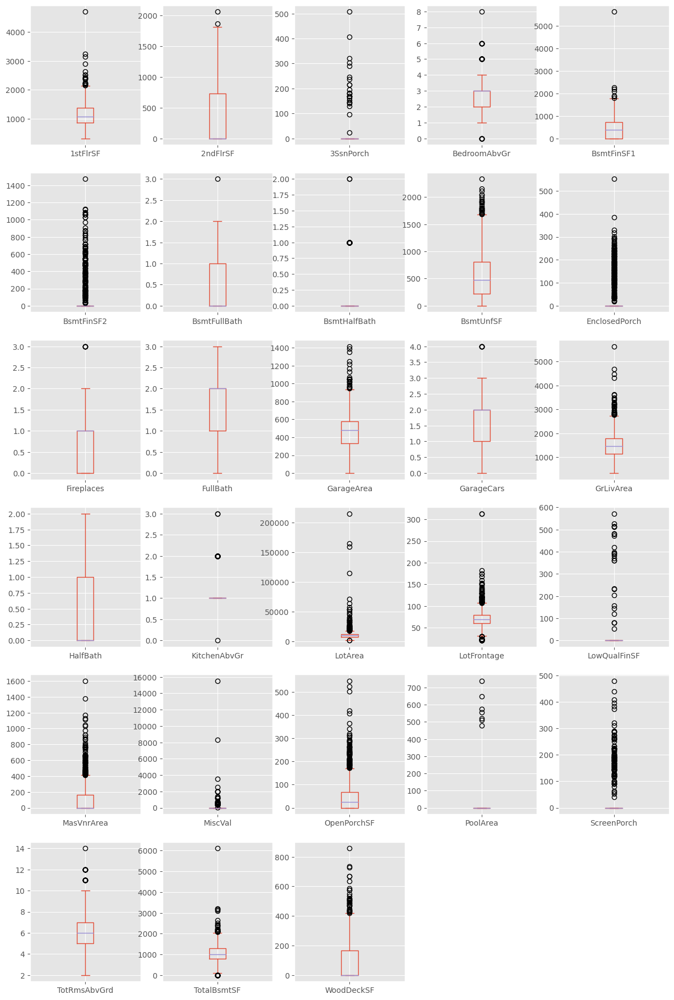

In [21]:
numericDF.plot(kind='box', subplots=True, sharex=False, sharey=False, figsize=(15, 27), layout=(7, 5))
plt.show()

##### **Scatter plot**

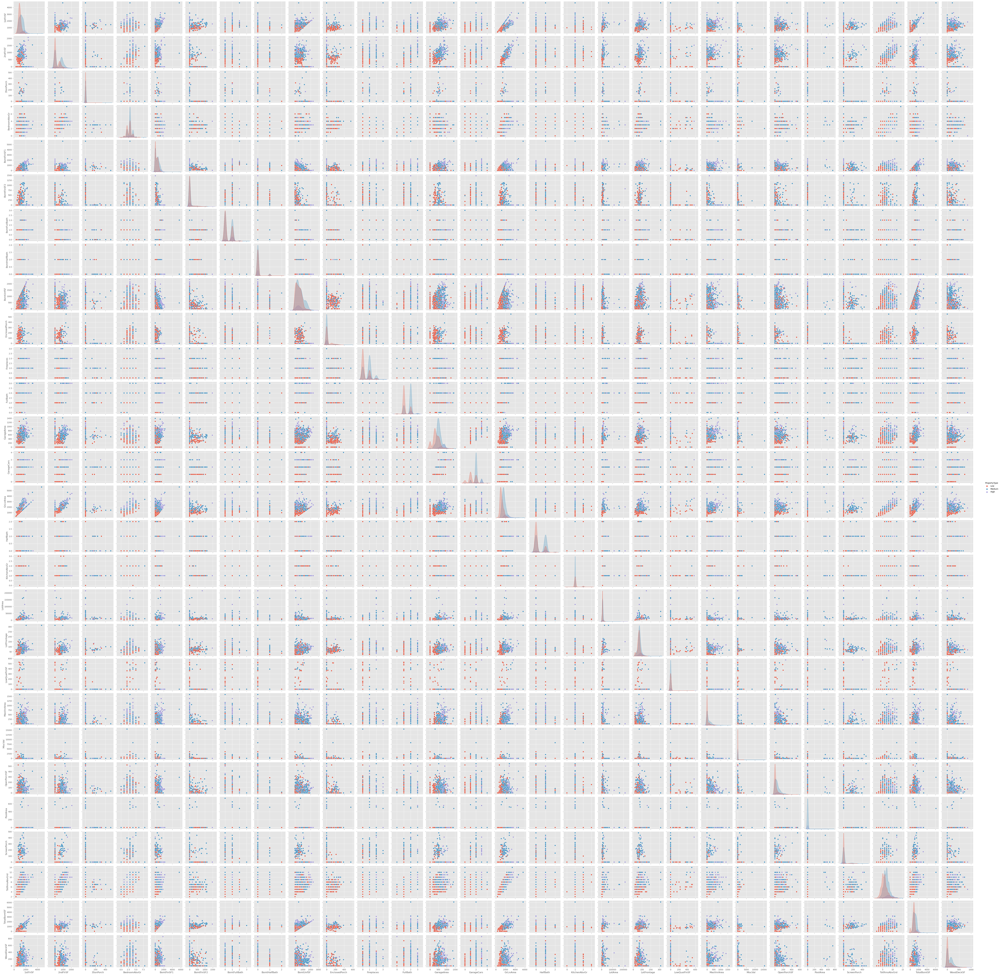

In [22]:
sb.pairplot(numericDF, hue = 'PropertyType')
plt.show()

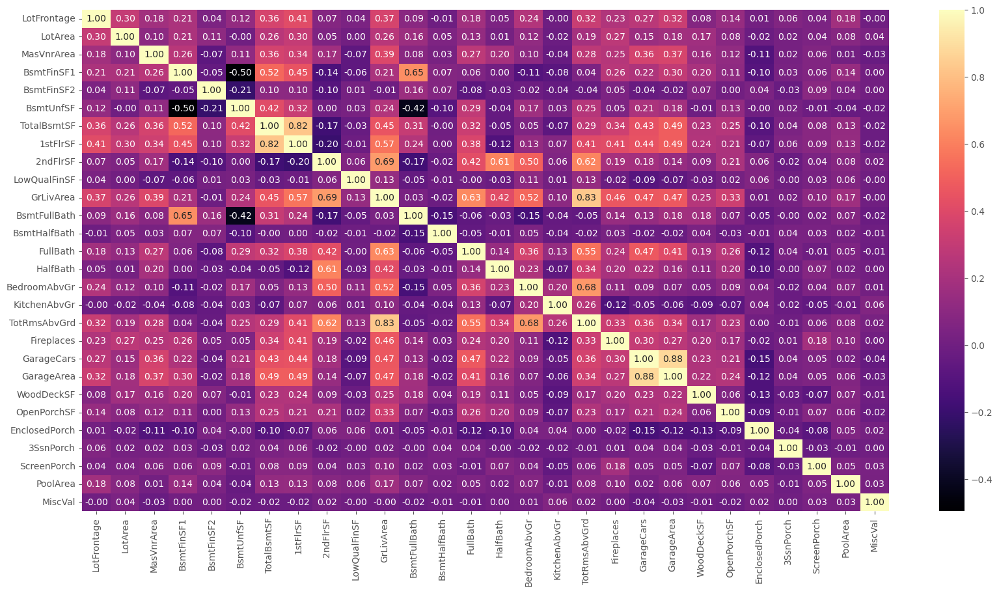

In [23]:
plt.figure(figsize=(20, 10))
sb.heatmap(df.corr(numeric_only=True), annot=True, cmap='magma', fmt='.2f')
plt.show()

### **Data Preparation**

##### *Remove all the attributes with too high (typically IDs) or too low variability (column that exhibit the same value for all the records) and all redundat attribute*

In [24]:
df = df[df.columns.difference(['PoolQC', 'Utilities', 'Condition2', 'RoofMatl', 'Street', 'Id', 'Heating', '3SsnPorch', 'LowQualFinSF', 'PoolArea'])]

In [25]:
df.head()

,1stFlrSF,2ndFlrSF,Alley,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,BsmtFinType1,...,RoofStyle,SaleCondition,SaleType,ScreenPorch,TotRmsAbvGrd,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
0,856,854,NA,3,1Fam,TA,No,706,0,GLQ,...,Gable,Normal,WD,0,8,856,0,2003,2003,2008
1,1262,0,NA,3,1Fam,TA,Gd,978,0,ALQ,...,Gable,Normal,WD,0,6,1262,298,1976,1976,2007
2,920,866,NA,3,1Fam,TA,Mn,486,0,GLQ,...,Gable,Normal,WD,0,6,920,0,2001,2002,2008
3,961,756,NA,3,1Fam,Gd,No,216,0,ALQ,...,Gable,Abnorml,WD,0,7,756,0,1915,1970,2006
4,1145,1053,NA,4,1Fam,TA,Av,655,0,GLQ,...,Gable,Normal,WD,0,9,1145,192,2000,2000,2008


##### *Discretization*

In [26]:
df['BedroomAbvGr_freq'] = pd.cut(df['BedroomAbvGr'].values, bins = (0, 2, 5, 8), labels = ('Low', 'Normal', 'High'), include_lowest=True)
df['BedroomAbvGr_freq'] = df['BedroomAbvGr_freq'].astype('category')
df['HalfBath_freq'] = pd.cut(df['HalfBath'].values, bins = (0.00, 0.50, 1.25, 2.00), labels = ('Low', 'Normal', 'High'), include_lowest=True)
df['HalfBath_freq'] = df['HalfBath_freq'].astype('category')
df['BsmtHalfBath_freq'] = pd.cut(df['BsmtHalfBath'].values, bins = (0.00, 0.50, 1.25, 2.00), labels = ('Low', 'Normal', 'High'), include_lowest=True)
df['BsmtHalfBath_freq'] = df['BsmtHalfBath_freq'].astype('category')
df['BsmtFullBath_freq'] = pd.cut(df['BsmtFullBath'].values, bins = (0.0, 1.0, 2.0, 3.0), labels = ('Low', 'Normal', 'High'), include_lowest=True)
df['BsmtFullBath_freq'] = df['BsmtFullBath_freq'].astype('category')

In [27]:
df.drop(columns=['BedroomAbvGr', 'HalfBath', 'BsmtHalfBath', 'BsmtFullBath'], inplace = True)

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 71 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   1stFlrSF           1460 non-null   int64   
 1   2ndFlrSF           1460 non-null   int64   
 2   Alley              1460 non-null   category
 3   BldgType           1460 non-null   category
 4   BsmtCond           1460 non-null   category
 5   BsmtExposure       1460 non-null   category
 6   BsmtFinSF1         1460 non-null   int64   
 7   BsmtFinSF2         1460 non-null   int64   
 8   BsmtFinType1       1460 non-null   category
 9   BsmtFinType2       1460 non-null   category
 10  BsmtQual           1460 non-null   category
 11  BsmtUnfSF          1460 non-null   int64   
 12  CentralAir         1460 non-null   category
 13  Condition1         1460 non-null   category
 14  Electrical         1460 non-null   category
 15  EnclosedPorch      1460 non-null   int64   
 16  ExterC

##### *Binarization*

In [29]:
cat_attributes = list(df.select_dtypes(include = ['category']).columns)
cat_attributes.remove('PropertyType')
df2 = pd.get_dummies(df, columns = cat_attributes)
new_attr_list = list(df2.columns)
new_attr_list.remove('PropertyType')
df2 = df2[new_attr_list]
df2.head()

,1stFlrSF,2ndFlrSF,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,EnclosedPorch,Fireplaces,FullBath,GarageArea,GarageCars,...,BedroomAbvGr_freq_High,HalfBath_freq_Low,HalfBath_freq_Normal,HalfBath_freq_High,BsmtHalfBath_freq_Low,BsmtHalfBath_freq_Normal,BsmtHalfBath_freq_High,BsmtFullBath_freq_Low,BsmtFullBath_freq_Normal,BsmtFullBath_freq_High
0,856,854,706,0,150,0,0,2,548,2,...,0,0,1,0,1,0,0,1,0,0
1,1262,0,978,0,284,0,1,2,460,2,...,0,1,0,0,0,1,0,1,0,0
2,920,866,486,0,434,0,1,2,608,2,...,0,0,1,0,1,0,0,1,0,0
3,961,756,216,0,540,272,1,1,642,3,...,0,1,0,0,1,0,0,1,0,0
4,1145,1053,655,0,490,0,1,2,836,3,...,0,0,1,0,1,0,0,1,0,0


In [30]:
index_numeric = []
numericAttributesRemoved = ['3SsnPorch', 'LowQualFinSF', 'PoolArea', 'BedroomAbvGr', 'HalfBath', 'BsmtHalfBath', 'BsmtFullBath']
numericAttributes = [n for n in numericAttributes if n not in numericAttributesRemoved]
for col in numericAttributes:
    index_numeric.append(df2.columns.get_loc(col))

### **Modeling**

##### **Split dataset**

In [31]:
from sklearn.model_selection import train_test_split
import numpy as np

In [32]:
x = np.array(df2.values)
y = np.array(df['PropertyType'].values)

seed = 388
test_size = .3
val_size = .2

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=test_size, random_state=seed)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=val_size, random_state=seed)

##### **Normalization**
- We normalize numeric attribute using StandarScaler: this will 'mean center' the attribute such that it has a mean of 0 and  standard deviation of 1

$ x_{new} = \frac{x - mean(x)}{std(x)}$

In [33]:
from sklearn.preprocessing import StandardScaler

In [34]:
scaler = StandardScaler()
scaler.fit(x_train[:, index_numeric])
x_train[:, index_numeric] = scaler.transform(x_train[:, index_numeric])
x_val[:, index_numeric] = scaler.transform(x_val[:, index_numeric]) 
x_test[:, index_numeric] = scaler.transform(x_test[:, index_numeric]) 

In [35]:
x_train_tmp = pd.DataFrame(x_train, columns=df2.columns)
x_train_tmp.head()

,1stFlrSF,2ndFlrSF,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,EnclosedPorch,Fireplaces,FullBath,GarageArea,GarageCars,...,BedroomAbvGr_freq_High,HalfBath_freq_Low,HalfBath_freq_Normal,HalfBath_freq_High,BsmtHalfBath_freq_Low,BsmtHalfBath_freq_Normal,BsmtHalfBath_freq_High,BsmtFullBath_freq_Low,BsmtFullBath_freq_Normal,BsmtFullBath_freq_High
0,0,0,0,0,0,0,0,-1,0,-1,...,0,1,0,0,1,0,0,1,0,0
1,-1,0,0,0,-1,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
2,0,0,0,0,0,0,0,0,1,1,...,0,0,1,0,1,0,0,1,0,0
3,1,0,0,0,2,0,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0
4,0,0,0,0,2,0,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0


In [36]:
x_train_tmp.describe().T

,count,mean,std,min,25%,50%,75%,max
1stFlrSF,817.0,0.085679,0.719138,-2.0,0.0,0.0,0.0,9.0
2ndFlrSF,817.0,0.242350,0.521610,0.0,0.0,0.0,0.0,3.0
BsmtFinSF1,817.0,0.201958,0.601954,0.0,0.0,0.0,0.0,11.0
BsmtFinSF2,817.0,0.193390,0.826524,0.0,0.0,0.0,0.0,9.0
BsmtUnfSF,817.0,0.068543,0.700281,-1.0,0.0,0.0,0.0,3.0
...,...,...,...,...,...,...,...,...
BsmtHalfBath_freq_Normal,817.0,0.059976,0.237587,0.0,0.0,0.0,0.0,1.0
BsmtHalfBath_freq_High,817.0,0.001224,0.034986,0.0,0.0,0.0,0.0,1.0
BsmtFullBath_freq_Low,817.0,0.986536,0.115321,0.0,1.0,1.0,1.0,1.0
BsmtFullBath_freq_Normal,817.0,0.013464,0.115321,0.0,0.0,0.0,0.0,1.0


##### **Create the models**

In [37]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier

from sklearn.metrics import classification_report

In [38]:
models = []   
models.append(('C45', DecisionTreeClassifier(criterion='entropy', random_state=seed)))
models.append(('CART', DecisionTreeClassifier(criterion='gini', random_state=seed)))
models.append(('GaussianNaiveBayes', GaussianNB()))
models.append(("RandomForest - entropy", RandomForestClassifier(criterion='entropy', random_state=seed))) 
models.append(('RandomForest - gini', RandomForestClassifier(criterion='gini',random_state=seed)))
models.append(('AdaBoost', AdaBoostClassifier(n_estimators=200, learning_rate=1.5, random_state=seed)))
models.append(('NeuralNetwork', MLPClassifier(hidden_layer_sizes=(50, 10, ), max_iter=500, verbose=True, 
                                              random_state=seed)))

# evaluate each model in turn

for name, model in models:
    print(name)

    model.fit(x_train, y_train)
    y_val_pred = model.predict(x_val)

    print('Classification metrics: ')
    print(classification_report(y_val, y_val_pred))

C45
Classification metrics: 
              precision    recall  f1-score   support

        High       0.55      0.92      0.69        12
         Low       0.83      0.82      0.82        92
      Medium       0.82      0.77      0.80       101

    accuracy                           0.80       205
   macro avg       0.73      0.83      0.77       205
weighted avg       0.81      0.80      0.80       205

CART
Classification metrics: 
              precision    recall  f1-score   support

        High       0.43      0.83      0.57        12
         Low       0.82      0.80      0.81        92
      Medium       0.79      0.72      0.76       101

    accuracy                           0.77       205
   macro avg       0.68      0.79      0.71       205
weighted avg       0.79      0.77      0.77       205

GaussianNaiveBayes
Classification metrics: 
              precision    recall  f1-score   support

        High       0.20      0.67      0.30        12
         Low       0.85   

### **Evaluation**

##### **Do predictions on test set**

In [39]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

In [40]:
model = RandomForestClassifier(criterion='entropy', random_state=seed)
model.fit(x_train, y_train)
predictions = model.predict(x_test)

In [41]:
print(f'Accuracy: {accuracy_score(y_test, predictions):.2f}')

Accuracy: 0.92


In [42]:
def make_confusion_matrix(cf, categories='auto', cbar=True, cmap='Blues', title=None):
    group_counts = [f'{value}\n' for value in cf.flatten()]

    box_labels = [f'{v1}'.strip() for v1 in group_counts]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])

    sb.heatmap(cf, annot=box_labels, fmt='', cmap=cmap, cbar=cbar, xticklabels=categories, yticklabels=categories)

    
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
    if title:
        plt.title(title)

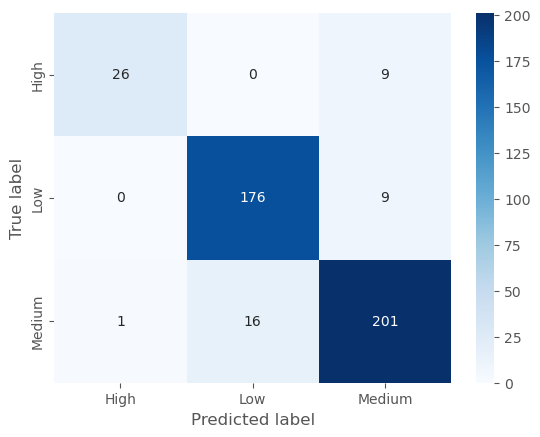

In [43]:
categories = ['High', 'Low', 'Medium']
make_confusion_matrix(confusion_matrix(y_test, predictions), categories=categories)

In [44]:
print('Classification report')
print(classification_report(y_test, predictions))

Classification report
              precision    recall  f1-score   support

        High       0.96      0.74      0.84        35
         Low       0.92      0.95      0.93       185
      Medium       0.92      0.92      0.92       218

    accuracy                           0.92       438
   macro avg       0.93      0.87      0.90       438
weighted avg       0.92      0.92      0.92       438



##### **Compute the Roc Curve for each class**

In [45]:
from sklearn.metrics import roc_curve, auc

In [46]:
one_hot_encoding = np.array(pd.get_dummies(y_test, columns = ['PropertyType']))

probs = []

models = []
models.append(('RandomForest - entropy', RandomForestClassifier(criterion='entropy', random_state=seed))) 

for _, model in models:
    model.fit(x_train, y_train)
    probs.append(model.predict_proba(x_test))

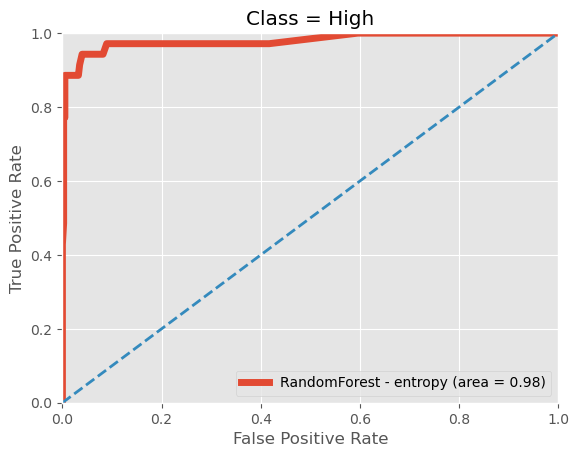

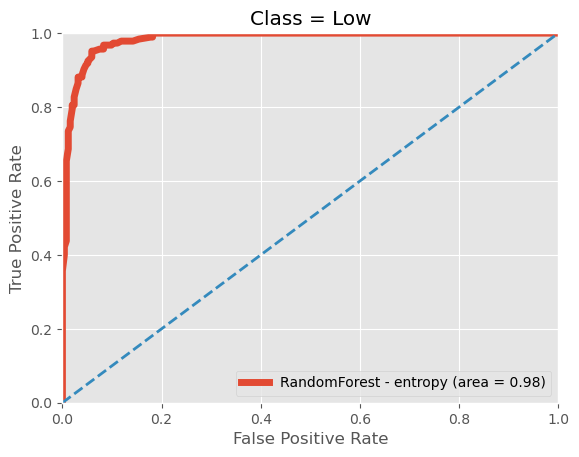

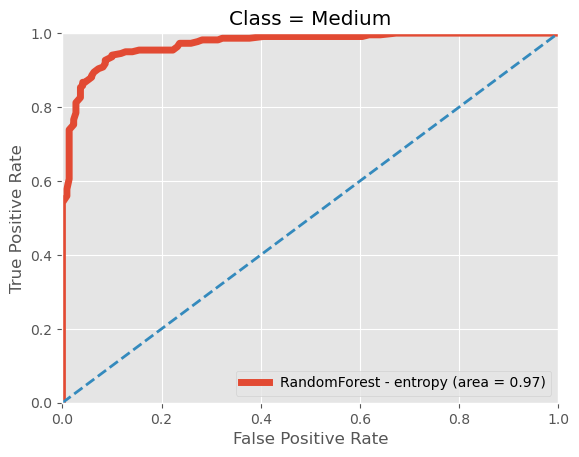

In [47]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(np.unique(y))):
    plt.figure()
    m = 0

    for name, _ in models:
        fpr[i], tpr[i], _ = roc_curve(one_hot_encoding[:, i], probs[m][:, i])
        
        roc_auc[i] = auc(fpr[i], tpr[i])

        plt.plot(fpr[i], tpr[i], lw=5, label=name + f' (area = {roc_auc[i]:.2f})')
        m += 1

    plt.plot([0, 1], [0, 1], lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Class = ' + str(np.unique(y)[i]))
    plt.legend(loc='lower right')

    plt.show()  